# Reproducing Villena-Gonzalez CDA Study (2020) - Channels

## Notes:
- Low5 & Top5 CDA not correlated with Perfomance on task.
- Some very nice CDAs, some subjects with No CDA at all... (uncorrelated with perf)
- Channels, AF7/8, F7/8 very very strong CDA like signal...
- Very interesting signal for the "recall" (after 900ms tracking)
- Midline channels strong after ~1200ms, probably du to motor activity giving answer to task.

In [20]:
import numpy as np
import glob
import pickle

import mne
from mne import Epochs, pick_channels, find_events
from mne.io import read_raw_bdf

import sys
#sys.path.append('/Users/nick/Documents/PhD/CLCT/CDA-review/studies/Villena-Gonzalez-2019/')
sys.path.append('D:\\PhD\\CDA-review\\studies\\Villena-Gonzalez-2019\\')
from events import get_specific_events, get_epochs, get_CDA
from events import prep_report, fill_report, get_report, checksum, add_cda_report, get_CDA_perf_report
 

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

In [21]:
#==================================================================
# General Variables
#==================================================================
## Organize Triggers
triggers = dict();

# --------------------------
triggers['1'] = [10,11,12,13] 
triggers['2'] = [20,21,22,23]
triggers['4'] = [40,41,42,43]

triggers['left'] = [11,12,21,22,41,42]
triggers['right'] = [10,13,20,23,40,43]

triggers['good'] = [60]
triggers['bad'] = [61]

# Labels
conds = ['1', '2', '4']
sides = ['left', 'right']
perfs = ['good', 'bad']

# Internal Triggers to Epochs Properly
internal_triggers = dict()
internal_triggers_count = 0
for cond in conds:
    for side in sides:
        for perf in perfs:
            internal_triggers_count = internal_triggers_count + 1
            internal_triggers['{}-{}-{}'.format(cond,side,perf)] = internal_triggers_count
            
# CDA Channels
chan_right = ['TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2']
chan_left =  ['TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1']

# Epoch information
epoch_length = 2.0
epoch_tmin = -0.4
baseline_corr = (-0.4, -0.2)

# CDA info
cda_window = (0.3, 0.9)

# CDA main variable!
cda_dict_all = dict()
epochs_dict_all = dict()
perf_report_all = dict()
report = prep_report(conds, sides, perfs)

## 1. Prep Data

In [22]:
#==================================================================
# Main Loop - Loading All Files & Extract CDAs.
#==================================================================
directory_path = 'D:\\CLNT\\Data\\Open Datasets\\Villena-Gonzalez 2019\\Data\\'
#directory_path = '/Users/nick/Documents/PhD/CDA Datasets/Villena-Gonzalez 2019/Data/'
sep = '/'

for filepath in glob.iglob(directory_path + '*.bdf'):
    filename = filepath[filepath.rfind(sep)+1:]
    print('Processing: ' + filename + '...')
   
    # ------------------------
    # 1. -- Load File --
    # ------------------------
    raw = read_raw_bdf(filepath, preload=True)

    # ------------------------
    # 2. -- Preprocessing --
    # ------------------------
    # Keep only EEG channels and reference
    #raw = raw.rename_channels({'EXG7':'A1', 'EXG8': 'A2'})
    raw = raw.drop_channels(ch_names=['EXG1','EXG2','EXG3','EXG4','EXG5','EXG6'])
    raw = raw.set_eeg_reference(ref_channels=['EXG7', 'EXG8'])
    raw = raw.set_channel_types({'EXG7': 'misc', 'EXG8': 'misc'})
    
    # Set Electrodes Locations
    montage = mne.channels.make_standard_montage('biosemi64')
    raw.set_montage(montage)

    # Resample
    preproc = raw.resample(1024)

    # Filter
    preproc = preproc.filter(.1, 20., fir_design='firwin', skip_by_annotation='edge')

    # Events
    events = find_events(preproc)
        
    # Select Channels (to save time on cleaning)
    preproc = preproc.pick_channels(chan_right_all + chan_left_all)
    
    # Plot (visual check)
    #preproct.plot...
    
    # ------------------------
    # 3. -- Epochs --
    # ------------------------
    specific_events = get_specific_events(events, conds, sides, perfs, triggers, internal_triggers)

    epochs_dict = get_epochs(preproc, specific_events, epoch_length, epoch_tmin, baseline_corr, clean=False)

    epochs_dict_all[filename] = epochs_dict
    
    # times, used for CDA mean amp report.
    times = epochs_dict['2']['left']['good'].times
    
    # ------------------------
    # 4. -- CDA --
    # ------------------------
    cda_dict_all[filename] = get_CDA(epochs_dict, conds, sides, perfs, chan_right, chan_left)
    
    # ------------------------
    # 6. - Report & Checksum -
    # ------------------------
    report = fill_report(report, filename, specific_events)
    report = add_cda_report(report, filename, conds, sides, perfs, cda_dict_all[filename], times, cda_window=cda_window)
    report.at[filename, 'checksum'] = checksum(specific_events, epochs_dict)
    
    perf_report_all[filename] = get_CDA_perf_report(epochs_dict, conds, sides, perfs, chan_right, chan_left, cda_window=cda_window)

# Print report
subreport = get_report(report, ['1','2', '4'], ['left','right'], ['good', 'bad'], [])
#report['perf'] = [0] * 23
report

Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\AP140119.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\AP140119.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 749567  =      0.000 ...   366.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
368 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
368 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\AP140119.bdf] Adding Mean CDA Amp for 1-left-good: 1.0362597140708367
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\AP140119.bdf] Adding Mean CDA Amp for 1-left-bad: 4.059651737454635
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\AP140119.bdf] Adding Mean CDA Amp for 1-right-good: 4.028787169718184
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\AP140119.bdf] Adding Mean CDA Amp for 1-right-bad: -6.622485685287808
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\AP140119.bdf] Adding Mean CDA Amp for 2-left-good: 3.4646031739548846
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\AP140119.bdf] Adding Mean CDA Amp for 2-left-bad: 2.2975254233324343
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\AP140119.bdf] Adding Mean CDA Amp for 2-right-good: 4.4433300194251375
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\AP140119.bdf] Sk

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 782335  =      0.000 ...   382.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf] Adding Mean CDA Amp for 1-left-good: 0.5092840886299275
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf] Adding Mean CDA Amp for 1-right-good: -2.3011671140047363
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf] Adding Mean CDA Amp for 1-right-bad: 2.822685614851194
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf] Adding Mean CDA Amp for 2-left-good: 1.7616157976527174
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf] Adding Mean CDA Amp for 2-left-bad: -9.041991371025583
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf] Adding Mean CDA Amp for 2-right-good: -0.7000414886164547
[D:\CLNT\Data\Open Datasets

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 767999  =      0.000 ...   375.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf] Adding Mean CDA Amp for 1-left-good: -1.4849552371481032
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf] Adding Mean CDA Amp for 1-right-good: 0.6933976733495879
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf] Adding Mean CDA Amp for 1-right-bad: 5.907291399235894
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf] Adding Mean CDA Amp for 2-left-good: -1.0080774537666333
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf] Skipping: 2-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf] Adding Mean CDA Amp for 2-right-good: 6.163079429167947
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf] Skipping: 2-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:302: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:303: RuntimeWarning: Mean of empty slice
  print('Cond: {} | Perf: {}, Mean: {}'.format(cond, perf, np.nanmean(cda_means)))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:313: RuntimeWa

Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CA080119.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CA080119.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 751615  =      0.000 ...   367.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CA080119.bdf] Adding Mean CDA Amp for 1-left-good: -0.37184106951772766
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CA080119.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CA080119.bdf] Adding Mean CDA Amp for 1-right-good: -0.3350527057687621
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CA080119.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CA080119.bdf] Adding Mean CDA Amp for 2-left-good: 3.8321363570480953
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CA080119.bdf] Adding Mean CDA Amp for 2-left-bad: 1.5325593876312205
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CA080119.bdf] Adding Mean CDA Amp for 2-right-good: -0.5056747434820171
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CA0

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:302: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:303: RuntimeWarning: Mean of empty slice
  print('Cond: {} | Perf: {}, Mean: {}'.format(cond, perf, np.nanmean(cda_means)))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CJ250319.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CJ250319.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 827391  =      0.000 ...   404.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
384 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
384 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CJ250319.bdf] Adding Mean CDA Amp for 1-left-good: 0.8374145595328335
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CJ250319.bdf] Adding Mean CDA Amp for 1-left-bad: -1.7589374381772676
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CJ250319.bdf] Adding Mean CDA Amp for 1-right-good: -0.8048633261238449
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CJ250319.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CJ250319.bdf] Adding Mean CDA Amp for 2-left-good: 1.6282000772389844
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CJ250319.bdf] Adding Mean CDA Amp for 2-left-bad: -4.278288520760944
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CJ250319.bdf] Adding Mean CDA Amp for 2-right-good: 0.11441614378391451
[D:\CLNT\Data\Open Datase

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CM190319.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CM190319.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 823295  =      0.000 ...   402.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CM190319.bdf] Adding Mean CDA Amp for 1-left-good: 2.139840236262384
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CM190319.bdf] Adding Mean CDA Amp for 1-left-bad: -0.22500100711729754
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CM190319.bdf] Adding Mean CDA Amp for 1-right-good: -1.637603356463253
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CM190319.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CM190319.bdf] Adding Mean CDA Amp for 2-left-good: 0.9539416887378539
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CM190319.bdf] Skipping: 2-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CM190319.bdf] Adding Mean CDA Amp for 2-right-good: -0.9546482214817245
[D:\CLNT\Data\Open Datas

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:302: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:303: RuntimeWarning: Mean of empty slice
  print('Cond: {} | Perf: {}, Mean: {}'.format(cond, perf, np.nanmean(cda_means)))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 796671  =      0.000 ...   389.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf] Adding Mean CDA Amp for 1-left-good: 6.292814995975902
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf] Adding Mean CDA Amp for 1-left-bad: 11.062759277910045
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf] Adding Mean CDA Amp for 1-right-good: 3.279799421587315
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf] Adding Mean CDA Amp for 2-left-good: 8.347153148611698
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf] Skipping: 2-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf] Adding Mean CDA Amp for 2-right-good: 8.955235158781228
[D:\CLNT\Data\Open Datasets\Vi

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:302: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:303: RuntimeWarning: Mean of empty slice
  print('Cond: {} | Perf: {}, Mean: {}'.format(cond, perf, np.nanmean(cda_means)))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DN250319.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DN250319.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 767999  =      0.000 ...   375.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
384 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
384 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DN250319.bdf] Adding Mean CDA Amp for 1-left-good: -0.7121845683878616
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DN250319.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DN250319.bdf] Adding Mean CDA Amp for 1-right-good: 0.937347977405473
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DN250319.bdf] Adding Mean CDA Amp for 1-right-bad: 0.7175794615905855
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DN250319.bdf] Adding Mean CDA Amp for 2-left-good: 0.721756897608027
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DN250319.bdf] Adding Mean CDA Amp for 2-left-bad: 1.0776962863394834
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DN250319.bdf] Adding Mean CDA Amp for 2-right-good: 1.6991572701

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DR210119.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DR210119.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 745471  =      0.000 ...   364.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DR210119.bdf] Adding Mean CDA Amp for 1-left-good: 2.4617447954206857
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DR210119.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DR210119.bdf] Adding Mean CDA Amp for 1-right-good: -3.758875033746192
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DR210119.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DR210119.bdf] Adding Mean CDA Amp for 2-left-good: 1.7952547621952146
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DR210119.bdf] Adding Mean CDA Amp for 2-left-bad: 3.234756251570404
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DR210119.bdf] Adding Mean CDA Amp for 2-right-good: 0.5117984846843917
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DR210119

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:302: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:303: RuntimeWarning: Mean of empty slice
  print('Cond: {} | Perf: {}, Mean: {}'.format(cond, perf, np.nanmean(cda_means)))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 753663  =      0.000 ...   368.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf] Adding Mean CDA Amp for 1-left-good: 0.46582817290129835
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf] Adding Mean CDA Amp for 1-left-bad: 2.9486554203128263
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf] Adding Mean CDA Amp for 1-right-good: 1.2381111077433773
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf] Adding Mean CDA Amp for 2-left-good: -3.572061780186506
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf] Adding Mean CDA Amp for 2-left-bad: -10.095693438980883
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf] Adding Mean CDA Amp for 2-right-good: 3.2207073

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\ER290419.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\ER290419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 3954687  =      0.000 ...  1931.000 secs...


<ipython-input-22-0f2f4310cc50>:15: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  raw = read_raw_bdf(filepath, preload=True)


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
1273 events found
Event IDs: [    1    10    11    12    13    20    21    22    23    30    31    32
    33    40    41    42    43    50    51    52    53    60    61    62
    63    64    65    66    67    68    69    70    71    72    73    74
    75    76    77    78    79    80    81 65536]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
1273 events found
Event IDs: [    1    10    11    12    13    20    21    22    23    30    31    32
    33    40    41    42    43    50    51    52    53    60    61    62
    63    64    65    66    67    68    69    70    71    72    73    74
    75    76    77    78    79    80   

259 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 259 events and 2459 original time points ...


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 259 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\ER290419.bdf] Adding Mean CDA Amp for 1-left-good: 2.8827457593522112
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\ER290419.bdf] Adding Mean CDA Amp for 1-left-bad: 3.2513225323793815
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\ER290419.bdf] Adding Mean CDA Amp for 1-right-good: -3.249830685034815
[D:\CLNT\Data\Open Datasets\Villena-Gonzale

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\FR070119.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\FR070119.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 767999  =      0.000 ...   375.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
381 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
381 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\FR070119.bdf] Adding Mean CDA Amp for 1-left-good: 4.581929600932911
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\FR070119.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\FR070119.bdf] Adding Mean CDA Amp for 1-right-good: 1.7463979418004372
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\FR070119.bdf] Adding Mean CDA Amp for 1-right-bad: 3.4345186676974206
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\FR070119.bdf] Adding Mean CDA Amp for 2-left-good: 5.794482144082469
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\FR070119.bdf] Adding Mean CDA Amp for 2-l

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\IP020519.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\IP020519.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 749567  =      0.000 ...   366.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\IP020519.bdf] Adding Mean CDA Amp for 1-left-good: 2.983333369619615
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\IP020519.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\IP020519.bdf] Adding Mean CDA Amp for 1-right-good: -0.551796724317936
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\IP020519.bdf] Adding Mean CDA Amp for 1-right-bad: 0.5127850499220618
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\IP020519.bdf] Adding Mean CDA Amp for 2-left-good: 2.4015109860950767
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\IP020519.bdf] Adding Mean CDA Amp for 2-left-bad: -1.2273387807888338
[D:\CL

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JC220119.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JC220119.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 767999  =      0.000 ...   375.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JC220119.bdf] Adding Mean CDA Amp for 1-left-good: -0.26282768445592325
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JC220119.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JC220119.bdf] Adding Mean CDA Amp for 1-right-good: -0.2593628520533653
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JC220119.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JC220119.bdf] Adding Mean CDA Amp for 2-left-good: 0.8410497365145732
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JC220119.bdf] Adding Mean CDA Amp for 2-left-bad: -2.1380888795370407
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JC220119.bdf] Adding Mean CDA Amp for 2-right-good: -1.7

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:302: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:303: RuntimeWarning: Mean of empty slice
  print('Cond: {} | Perf: {}, Mean: {}'.format(cond, perf, np.nanmean(cda_means)))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JH290119.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JH290119.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 737279  =      0.000 ...   360.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
376 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
376 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JH290119.bdf] Adding Mean CDA Amp for 1-left-good: 3.105264996350731
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JH290119.bdf] Adding Mean CDA Amp for 1-left-bad: 6.051596519603756
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JH290119.bdf] Adding Mean CDA Amp for 1-right-good: 2.369199751740221
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JH290119.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JH290119.bdf] Adding Mean CDA Amp for 2-left-good: 2.4925845843465577
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JH290119.bdf] Adding Mean CDA Amp for 2-left-bad: 4.48858842036491
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JH290119.bdf] Adding Mean CDA Amp for 2-right-good: 2.3447203783941477
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JH290119.bdf] Ad

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LB020419.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LB020419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 821247  =      0.000 ...   401.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
380 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
380 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LB020419.bdf] Adding Mean CDA Amp for 1-left-good: -2.1541987316562534
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LB020419.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LB020419.bdf] Adding Mean CDA Amp for 1-right-good: 2.606700902242483
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LB020419.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LB020419.bdf] Adding Mean CDA Amp for 2-left-good: -1.72985329759922
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LB020419.bdf] Adding Mean CDA Amp for 2-left-bad: -0.32645039168830237
[D:\CLNT\Data\Open Datasets\Villena-Gon

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:302: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:303: RuntimeWarning: Mean of empty slice
  print('Cond: {} | Perf: {}, Mean: {}'.format(cond, perf, np.nanmean(cda_means)))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LF210119.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LF210119.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 739327  =      0.000 ...   361.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LF210119.bdf] Adding Mean CDA Amp for 1-left-good: 6.427851626147697
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LF210119.bdf] Adding Mean CDA Amp for 1-left-bad: -29.37820710540079
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LF210119.bdf] Adding Mean CDA Amp for 1-right-good: -6.08287926535336
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LF210119.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LF210119.bdf] Adding Mean CDA Amp for 2-left-good: 0.028425182146750157
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LF210119.bdf] Adding Mean CDA Amp for 2-left-bad: 32.97091805532008
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LF210119.bdf] Adding Mean CDA Amp for 2-right-good: -7.3773009875289315
[D:\CLNT\Data\Open Datasets\

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LS150419.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LS150419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 790527  =      0.000 ...   386.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65577 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
380 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65577 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
380 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LS150419.bdf] Adding Mean CDA Amp for 1-left-good: 1.5431190335916978
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LS150419.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LS150419.bdf] Adding Mean CDA Amp for 1-right-good: 0.3133579913011941
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LS150419.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LS150419.bdf] Adding Mean CDA Amp for 2-left-good: 2.0775743392706745
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LS150419.bdf] Adding Mean CDA Amp for 2-left-bad: -4.4297965823149
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LS150419.bdf] Adding Mean CDA Amp for 2-right-good: 2.0925217077238356
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LS150419.

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:302: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:303: RuntimeWarning: Mean of empty slice
  print('Cond: {} | Perf: {}, Mean: {}'.format(cond, perf, np.nanmean(cda_means)))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\MM220419.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\MM220419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 811007  =      0.000 ...   396.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65559 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65559 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\MM220419.bdf] Adding Mean CDA Amp for 1-left-good: 1.1027784685756277
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\MM220419.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\MM220419.bdf] Adding Mean CDA Amp for 1-right-good: 2.6178317540368066
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\MM220419.bdf] Adding Mean CDA Amp for 1-right-bad: 1.4147729279203036
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\MM220419.bdf] Adding Mean CDA Amp for 2-left-good: 1.4138443594123316
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\MM220419.bdf] Skipping: 2-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\MM220419.bdf] Adding Mean CDA Amp for 2-right-good: 3.3025909933904902
[D:\CLNT\Data\Open Dataset

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:302: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:303: RuntimeWarning: Mean of empty slice
  print('Cond: {} | Perf: {}, Mean: {}'.format(cond, perf, np.nanmean(cda_means)))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RG100419.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RG100419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 831487  =      0.000 ...   406.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65569 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65569 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RG100419.bdf] Adding Mean CDA Amp for 1-left-good: 0.023121531102944085
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RG100419.bdf] Adding Mean CDA Amp for 1-left-bad: 1.1874631897710055
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RG100419.bdf] Adding Mean CDA Amp for 1-right-good: 0.19611234169286743
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RG100419.bdf] Adding Mean CDA Amp for 1-right-bad: 3.2182327806801116
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RG100419.bdf] Adding Mean CDA Amp for 2-left-good: 1.2477990198861466
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RG100419.bdf] Skipping: 2-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RG100419.bdf] Adding Mean CDA Amp for 2-right-good: 2.371236491075991
[D:\CLNT\Data\Open Dataset

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RM280119.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RM280119.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 837631  =      0.000 ...   409.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
371 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
371 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RM280119.bdf] Adding Mean CDA Amp for 1-left-good: 0.22933330585688985
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RM280119.bdf] Adding Mean CDA Amp for 1-left-bad: -0.40971672063317677
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RM280119.bdf] Adding Mean CDA Amp for 1-right-good: -0.05377780951444524
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RM280119.bdf] Adding Mean CDA Amp for 1-right-bad: 1.7892514114966354
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RM280119.bdf] Adding Mean CDA Amp for 2-left-good: 0.11825137537485564
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\RM280119.bdf] Adding Mean CDA Amp for 2-left-bad: 1.3720996529739653
[D:\CLNT\Data\Open Datasets\Villena-Gonza

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\SS150119.bdf] Adding Mean CDA Amp for 1-left-good: -0.6119713846700919
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\SS150119.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\SS150119.bdf] Adding Mean CDA Amp for 1-right-good: -0.4131294832196858
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\SS150119.bdf] Skipping: 1-right-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\SS150119.bdf] Adding Mean CDA Amp for 2-left-good: -1.2593580806497335
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\SS150119.bdf] Adding Mean CDA Amp for 2-left-bad: -0.653047939697509
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\SS150119.bdf] Adding Mean CDA Amp for 2-right-good: 1.8729442306116442
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\SS150119.bdf] Skipping: 2-right-bad
[D:\CL

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:302: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:303: RuntimeWarning: Mean of empty slice
  print('Cond: {} | Perf: {}, Mean: {}'.format(cond, perf, np.nanmean(cda_means)))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\VK030119.bdf...
Extracting EDF parameters from D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\VK030119.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 798719  =      0.000 ...   390.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
381 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
381 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz


D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\VK030119.bdf] Adding Mean CDA Amp for 1-left-good: 2.5350711617648227
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\VK030119.bdf] Skipping: 1-left-bad
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\VK030119.bdf] Adding Mean CDA Amp for 1-right-good: -0.8941913786893096
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\VK030119.bdf] Adding Mean CDA Amp for 1-right-bad: -0.6519879942863691
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\VK030119.bdf] Adding Mean CDA Amp for 2-left-good: 0.29665485035933853
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\VK030119.bdf] Adding Mean CDA Amp for 2-left-bad: 1.1385625357104594
[D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\VK030119.bdf] Adding Mean CDA Amp for 2-right-good: 1.8191582914660596
[D:\CLNT\Data\Open Datase

D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:289: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:300: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
D:\PhD\CDA-review\studies\Villena-Gonzalez-2019\events.py:311: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


,1,2,4,left,right,good,bad,1-left,1-left-CDA,1-left-good,...,4-right-good,4-right-good-CDA,right-good-CDA,4-right-bad,4-right-bad-CDA,right-bad-CDA,checksum,notes,good-CDA,bad-CDA
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\AP140119.bdf,32,32,32,48,48,73,23,16,0,9,...,13,5.918056,4.796724,3,4.906679,-0.857903,1,,4.254228,1.719171
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf,32,32,32,48,48,87,9,16,0,16,...,12,2.196924,-0.268095,4,-1.103031,0.859827,1,0,0.613383,-0.485465
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf,32,32,32,48,48,94,2,16,0,16,...,15,3.730161,3.528879,1,7.662354,6.784823,1,0,1.441466,6.784823
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CA080119.bdf,32,32,32,48,48,83,13,16,0,16,...,11,-0.957429,-0.599385,5,1.556279,-1.068329,1,0,0.579460,0.841856
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CJ250319.bdf,32,32,32,48,48,79,17,16,0,15,...,8,2.802842,0.704132,8,2.550181,3.700805,1,0,0.971310,-0.132947
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CM190319.bdf,32,32,32,48,48,86,10,16,0,15,...,12,-0.353441,-0.981898,4,-0.14698,-0.14698,1,0,0.323052,1.068419
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf,32,32,32,48,48,92,4,16,0,15,...,14,9.061828,7.098954,2,17.553253,17.553253,1,0,7.541488,13.32111
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DN250319.bdf,32,32,32,48,48,84,12,16,0,16,...,12,2.880755,1.839087,4,5.494109,1.184329,1,0,0.980316,0.838663
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DR210119.bdf,32,32,32,48,48,79,17,16,0,16,...,8,0.298852,-0.982741,8,-0.394309,0.907764,1,0,0.491451,2.714103
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf,32,32,32,48,48,88,8,16,0,14,...,13,3.373533,2.610784,3,5.699371,5.699371,1,0,0.385446,0.658933


In [23]:
for id in report.index:
    report.at[id, 'perf'] = int(report.at[id, 'good'] / (report.at[id, 'good'] + report.at[id, 'bad']) * 100)

top5 = (report.sort_values(by=['perf'], ascending=False)).index[0:5]
low5 = (report.sort_values(by=['perf'], ascending=False)).index[-5:]
print(top5)

report.sort_values(by=['perf'], ascending=False)

Index(['D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf',
       'D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf',
       'D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\SS150119.bdf',
       'D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf',
       'D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf'],
      dtype='object')


,1,2,4,left,right,good,bad,1-left,1-left-CDA,1-left-good,...,4-right-good-CDA,right-good-CDA,4-right-bad,4-right-bad-CDA,right-bad-CDA,checksum,notes,good-CDA,bad-CDA,perf
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BO090419.bdf,32,32,32,48,48,94,2,16,0,16,...,3.730161,3.528879,1,7.662354,6.784823,1,0,1.441466,6.784823,97.0
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CS230419.bdf,32,32,32,48,48,92,4,16,0,15,...,9.061828,7.098954,2,17.553253,17.553253,1,0,7.541488,13.32111,95.0
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\SS150119.bdf,32,32,32,48,48,89,7,16,0,16,...,2.206101,1.221972,2,3.964899,3.964899,1,0,0.214819,1.041909,92.0
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DS220119.bdf,32,32,32,48,48,88,8,16,0,14,...,3.373533,2.610784,3,5.699371,5.699371,1,0,0.385446,0.658933,91.0
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\BG160419.bdf,32,32,32,48,48,87,9,16,0,16,...,2.196924,-0.268095,4,-1.103031,0.859827,1,0,0.613383,-0.485465,90.0
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\JC220119.bdf,32,32,32,48,48,86,10,16,0,16,...,-0.150834,-0.728601,4,-0.966802,-0.261524,1,0,0.005382,-1.45683,89.0
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\MM220419.bdf,32,32,32,48,48,86,10,16,0,16,...,5.467811,3.796078,4,2.721251,2.068012,1,0,3.057938,2.108924,89.0
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\CM190319.bdf,32,32,32,48,48,86,10,16,0,15,...,-0.353441,-0.981898,4,-0.14698,-0.14698,1,0,0.323052,1.068419,89.0
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\LF210119.bdf,32,32,32,48,48,85,11,16,0,15,...,-24.336459,-12.59888,5,-6.652769,-6.652769,1,0,-4.591566,1.430166,88.0
D:\CLNT\Data\Open Datasets\Villena-Gonzalez 2019\Data\DN250319.bdf,32,32,32,48,48,84,12,16,0,16,...,2.880755,1.839087,4,5.494109,1.184329,1,0,0.980316,0.838663,87.0


In [24]:
with open('D:\\PhD\\CDA-review\\studies\\_channels\\Villena-2019-Channels.pkl', 'wb') as f:
    pickle.dump(epochs_dict_all, f)
    
del epochs_dict_all

In [30]:
with open('D:\\PhD\\CDA-review\\studies\\_channels\\Villena-2019-Channels.pkl', 'rb') as f:
    epochs_dict_all = pickle.load(f)

In [14]:
del epochs_dict_all

## 2. Get CDA

### 2.1 Prep CDA - All Channel Pairs

In [31]:
# YR: Confirmed channels!
chan_left_all =  ['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1']
chan_right_all = ['Fp2', 'AF8', 'AF4', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2']

cda_dict = dict()
cda_all_channels = dict()
cda_all_channels_per_subj = dict()
for f in epochs_dict_all.keys():
    cda_all_channels_per_subj[f] = dict()
    for cond in conds:
        cda_all_channels[cond] = dict()
        cda_all_channels_per_subj[f][cond] = dict()
        for perf in perfs:
            cda_all_channels[cond][perf] = dict()
            cda_all_channels_per_subj[f][cond][perf] = dict()

# Get CDA per Channel-Pair
for i, ch in enumerate(chan_right_all):
    # Get CDA for a specific Channel-Pair for all Subjects
    for filename in epochs_dict_all.keys():
        cda_dict[filename] = get_CDA(epochs_dict_all[filename], conds, sides, perfs, [chan_right_all[i]], [chan_left_all[i]])

    # For each Cond-Perf get the CDA per Channel-Pair across Subjects
    cda_all = dict()
    for cond in cda_dict[list(cda_dict.keys())[0]].keys():
        cda_all[cond] = dict()
        
        for perf in ['good']: #perfs:
            cda_all[cond][perf] = dict()

            for f in cda_dict.keys():
                ldict = cda_dict[f][cond]['left']
                rdict = cda_dict[f][cond]['right']
                if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):
                    cda_dict_cur = (cda_dict[f][cond]['left'][perf] + cda_dict[f][cond]['right'][perf])/2
                    cda_all[cond][perf] = np.vstack([cda_all[cond][perf], cda_dict_cur]) if len(cda_all[cond][perf]) else cda_dict_cur
                    cda_all_channels_per_subj[f][cond][perf]["{}-{}".format(chan_left_all[i], chan_right_all[i])] = cda_dict_cur
                else:
                    print("==== SKIPPED: 0 points! (File: {} - Cond: {} - Perf: {})".format(str(f), str(cond), perf))
        
            cda_all_channels[cond][perf]["{}-{}".format(chan_left_all[i], chan_right_all[i])] = cda_all[cond][perf].mean(0)
            

In [32]:
times = epochs_dict_all[filename][cond]['left'][perf].times

### 2.1 Plot CDA - All Channel Pairs (Group Level / All Subjects)

### Note:

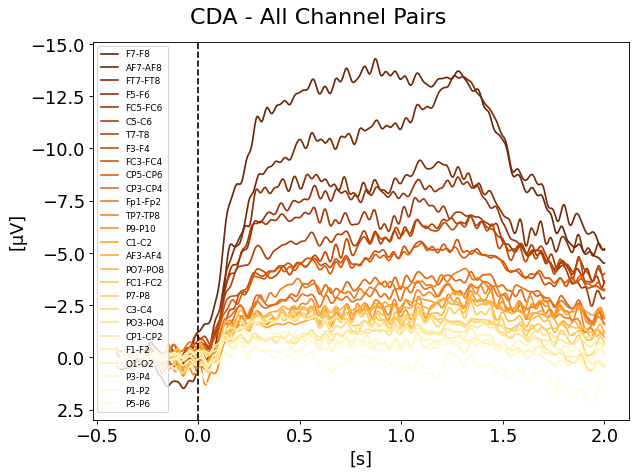

In [46]:
plt.rcParams.update({'font.size': 16})
cmap = matplotlib.cm.get_cmap('YlOrBr')

perf = 'good'
cond = '2'

fig = plt.figure(figsize=(8, 6), dpi=80)
#plt.suptitle("Cond: {} [{}] - All Channel Pairs".format(cond, perf), fontsize=24)
plt.suptitle("CDA - All Channel Pairs", fontsize=20)

ch_pair_mean_amp = [cda_all_channels[cond][perf][x].mean(0) for x in cda_all_channels[cond][perf]]
mean_list, cda_sorted = zip(*sorted(zip(ch_pair_mean_amp, cda_all_channels[cond][perf].items()), reverse=True))

nb_pairs = len(cda_all_channels[cond][perf].keys())
for i, ch_pair in enumerate(cda_all_channels[cond][perf].keys()):
    plt.plot((times), cda_sorted[i][1] * -1e6, label=cda_sorted[i][0], color=cmap(1-i/nb_pairs))

plt.axvline(x=0, color='k', linestyle='--')
plt.ylabel('[μV]')
plt.xlabel('[s]')
plt.gca().invert_yaxis()
plt.rcParams.update({'font.size': 8})
plt.legend(loc=2)
plt.tight_layout()
plt.show()

fig.savefig("./Villena2019-channels.png", dpi=300, format='png')

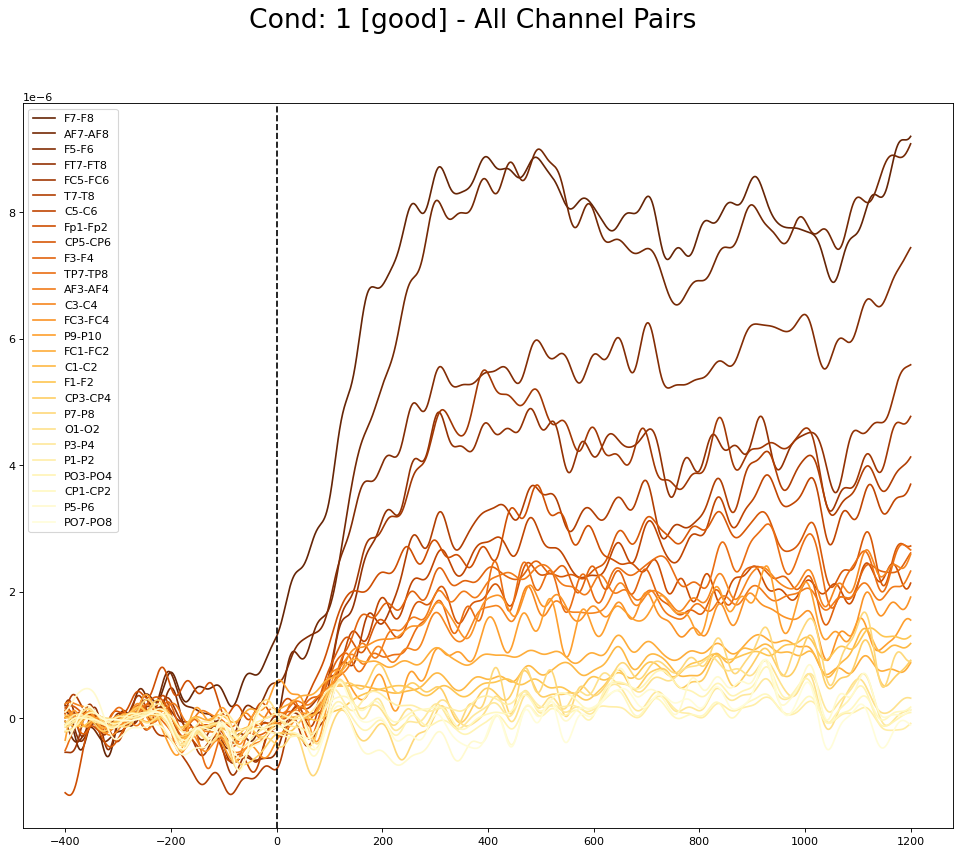

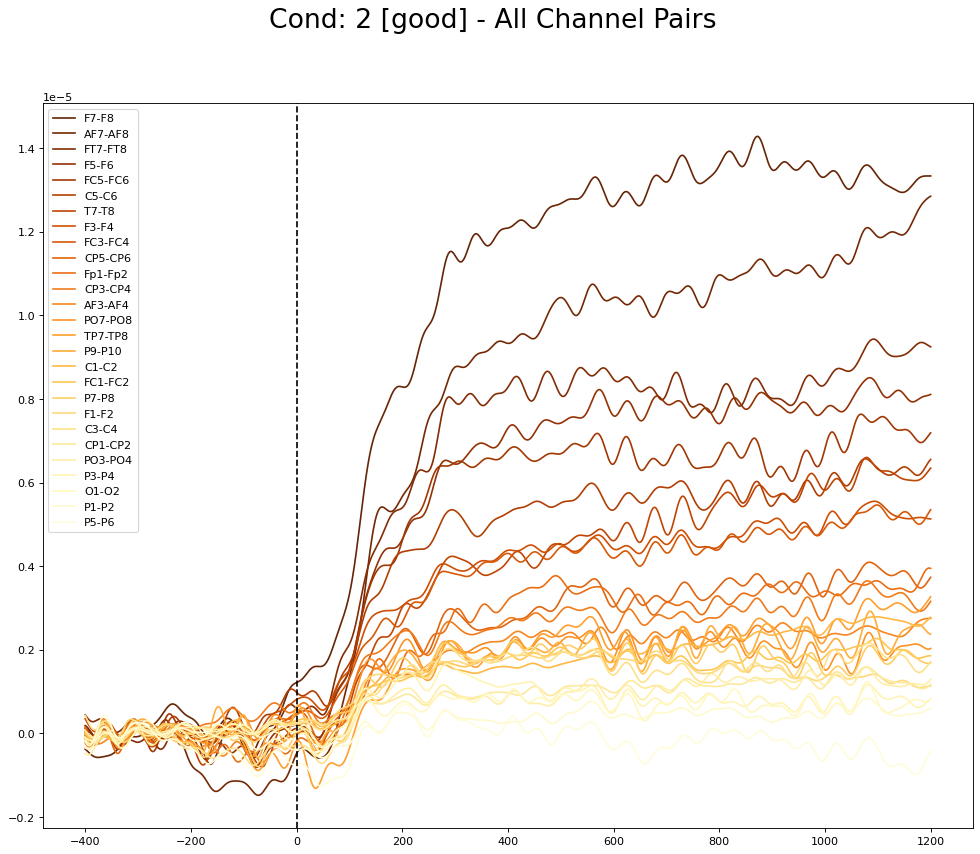

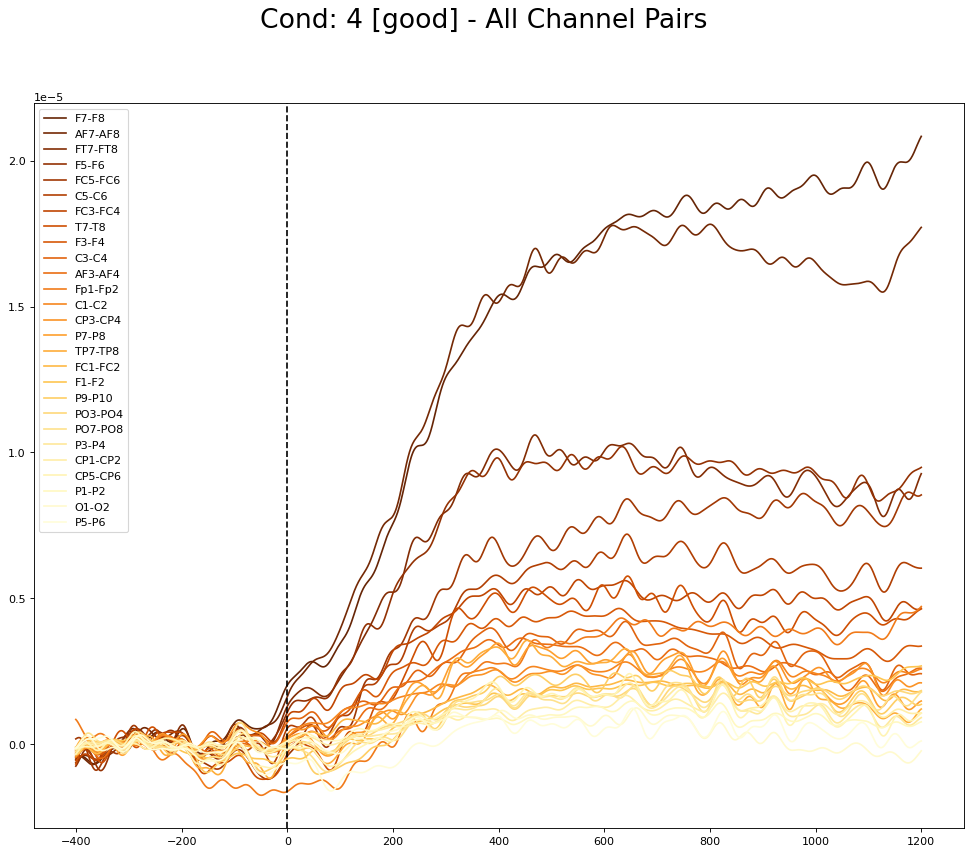

In [11]:
cmap = matplotlib.cm.get_cmap('YlOrBr')

for perf in ['good']:#perfs:
    for cond in conds:
        plt.figure(figsize=(15, 12), dpi=80)
        plt.suptitle("Cond: {} [{}] - All Channel Pairs".format(cond, perf), fontsize=24)

        ch_pair_mean_amp = [cda_all_channels[cond][perf][x].mean(0) for x in cda_all_channels[cond][perf]]
        mean_list, cda_sorted = zip(*sorted(zip(ch_pair_mean_amp, cda_all_channels[cond][perf].items()), reverse=True))

        nb_pairs = len(cda_all_channels[cond][perf].keys())
        for i, ch_pair in enumerate(cda_all_channels[cond][perf].keys()):
            plt.plot((times * 1000), cda_sorted[i][1], label=cda_sorted[i][0], color=cmap(1-i/nb_pairs))

        plt.axvline(x=0, color='k', linestyle='--')
        #plt.gca().invert_yaxis()
        plt.legend()
        plt.show()

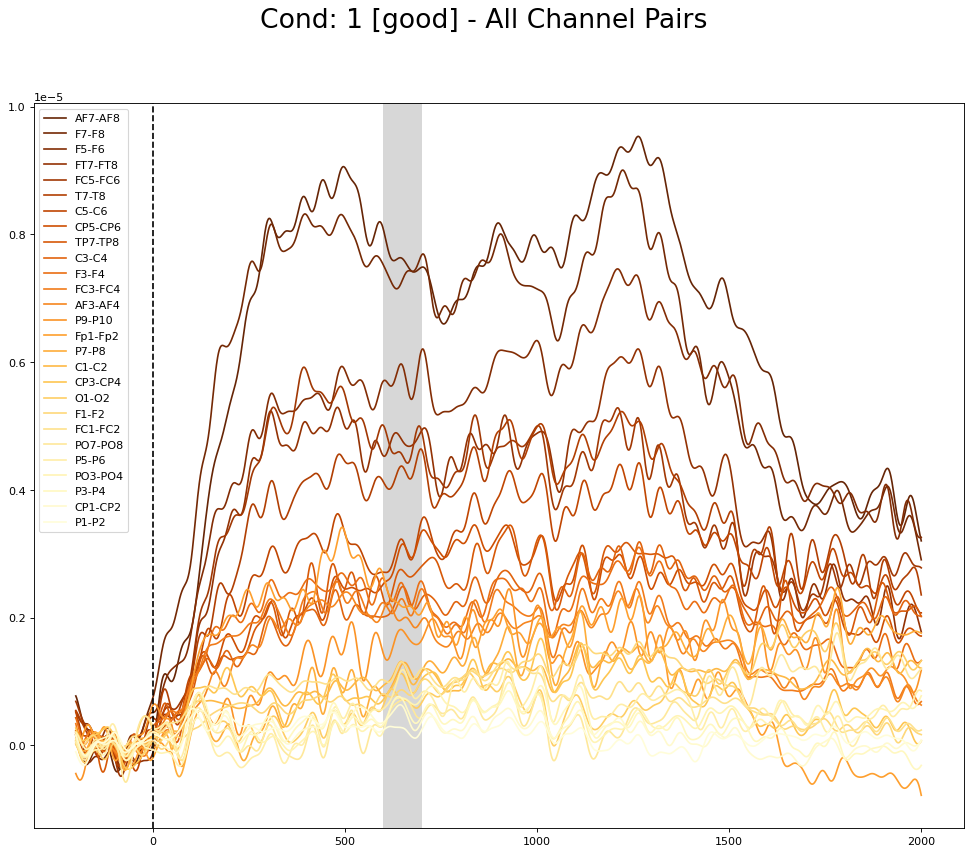

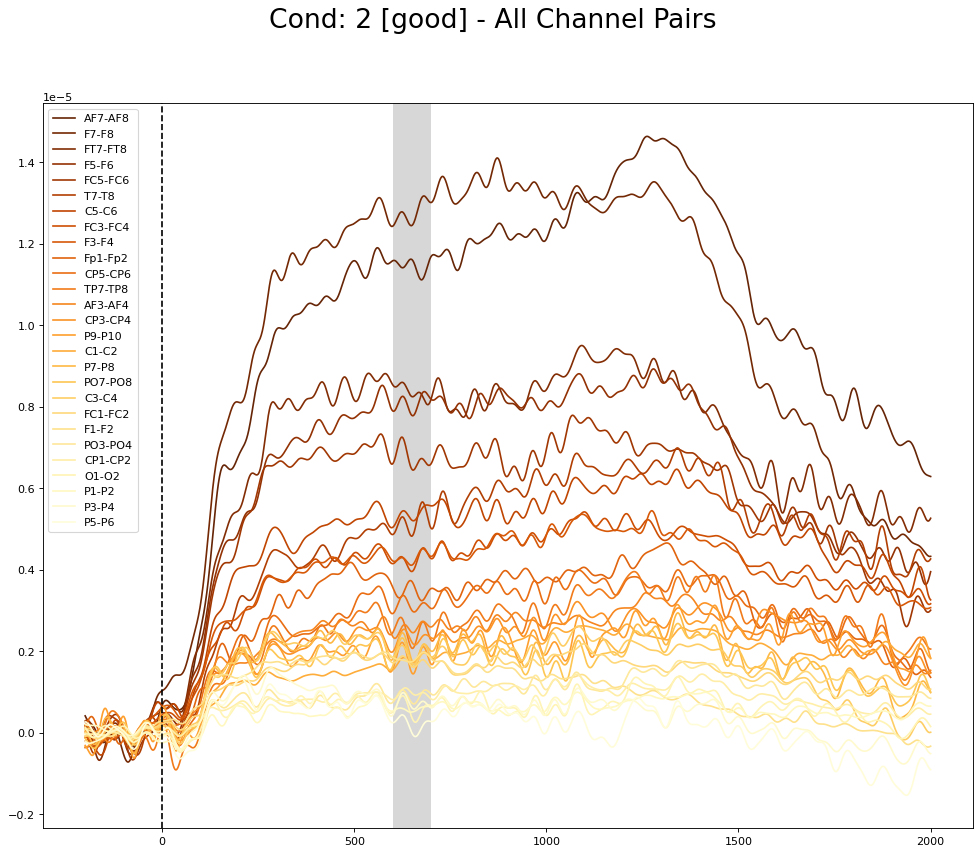

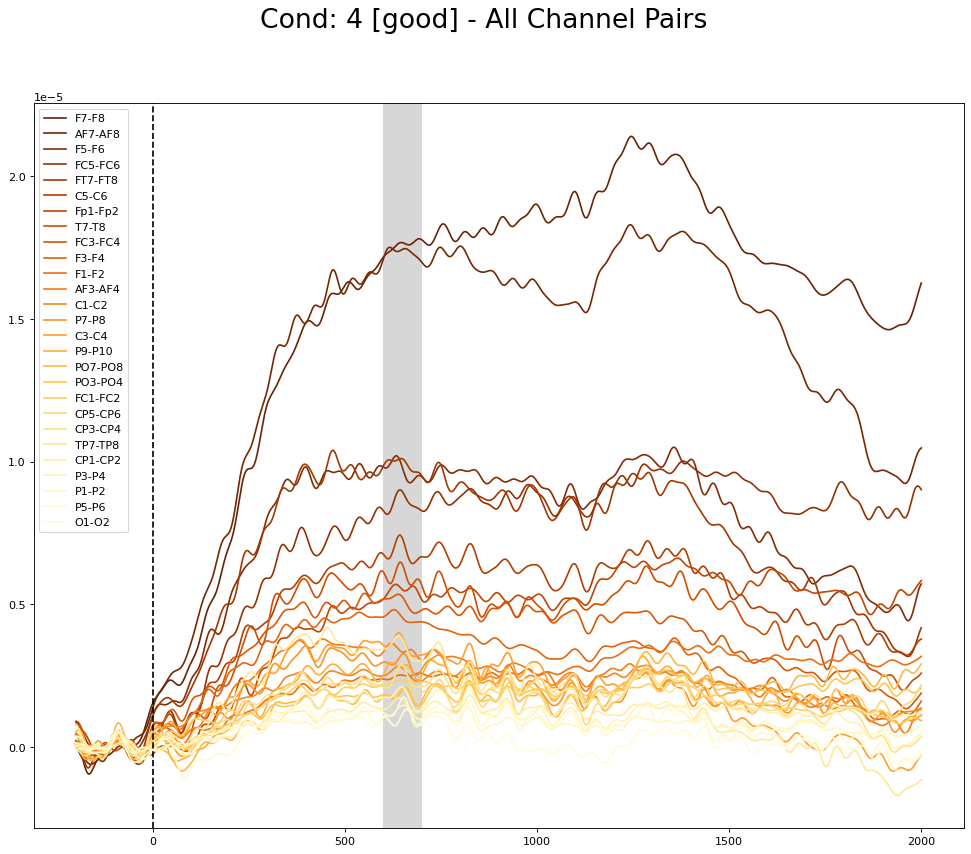

In [50]:
cmap = matplotlib.cm.get_cmap('YlOrBr')

for perf in ['good']:#perfs:
    for cond in conds:
        plt.figure(figsize=(15, 12), dpi=80)
        plt.suptitle("Cond: {} [{}] - All Channel Pairs".format(cond, perf), fontsize=24)

        ch_pair_mean_amp = [cda_all_channels[cond][perf][x].mean(0) for x in cda_all_channels[cond][perf]]
        mean_list, cda_sorted = zip(*sorted(zip(ch_pair_mean_amp, cda_all_channels[cond][perf].items()), reverse=True))

        nb_pairs = len(cda_all_channels[cond][perf].keys())
        for i, ch_pair in enumerate(cda_all_channels[cond][perf].keys()):
            plt.plot((times * 1000), cda_sorted[i][1], label=cda_sorted[i][0], color=cmap(1-i/nb_pairs))

        plt.axvline(x=0, color='k', linestyle='--')
        #plt.gca().invert_yaxis()
        plt.legend()
        plt.show()

### 2.2 Plot CDA - All Channel Pairs (Subject Level / Per Subject)

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_1702/739167796.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15, 12), dpi=80)


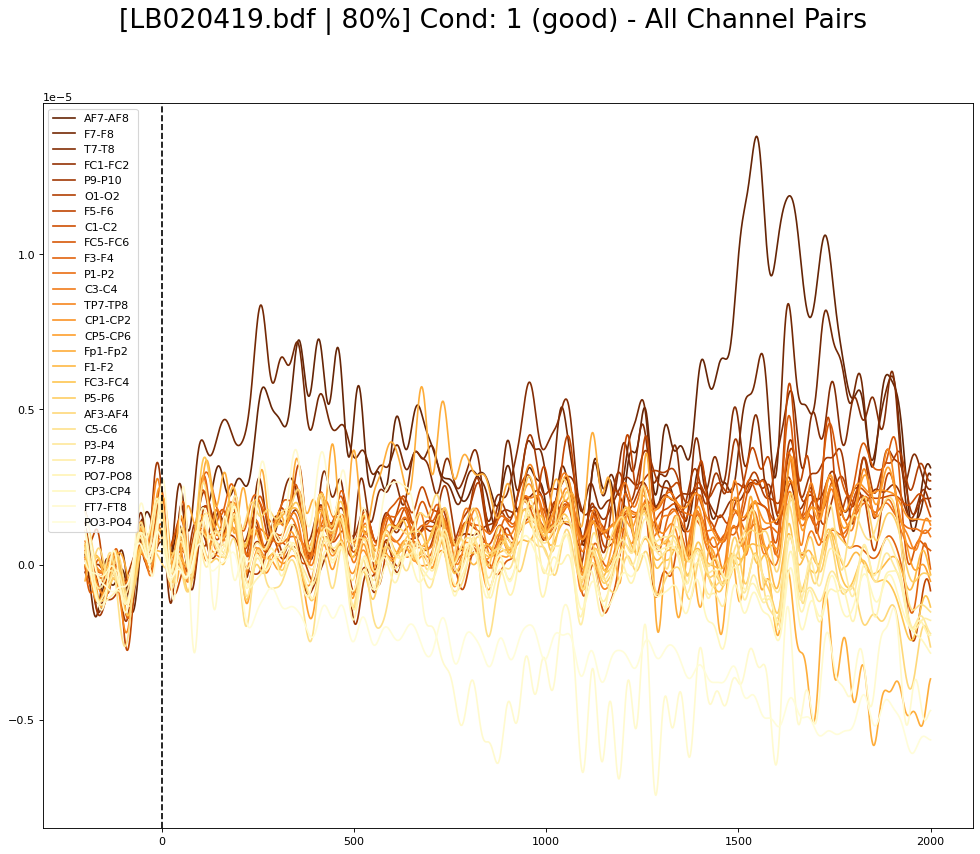

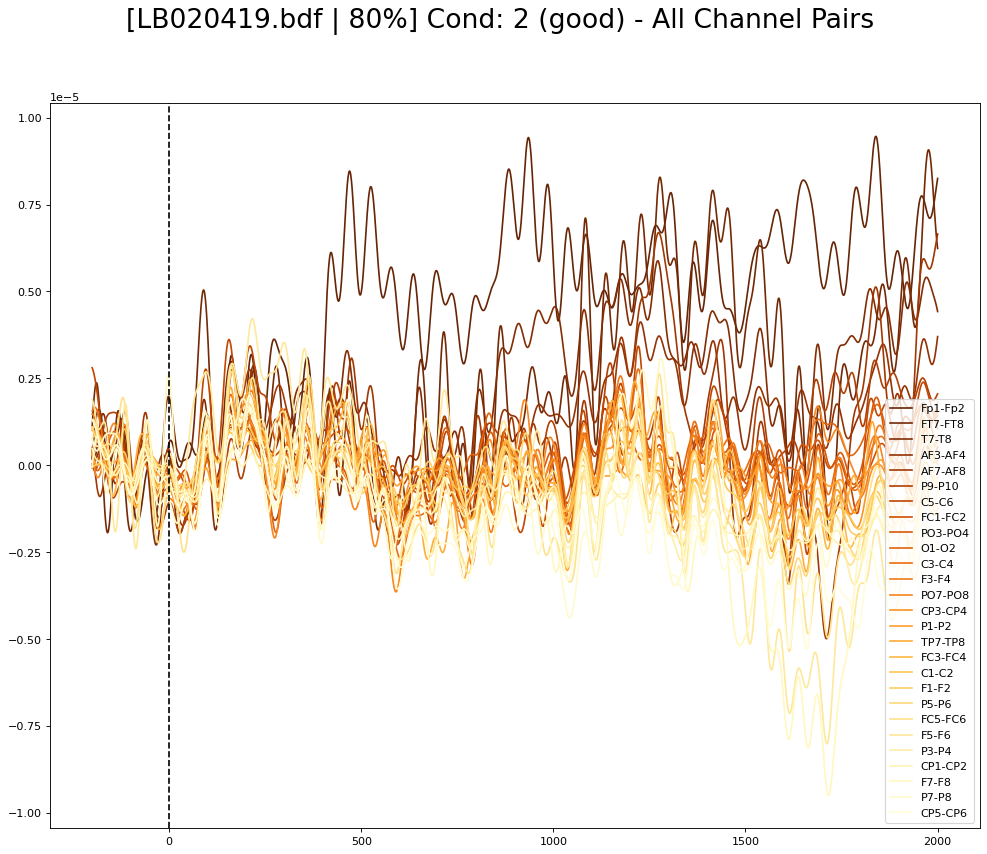

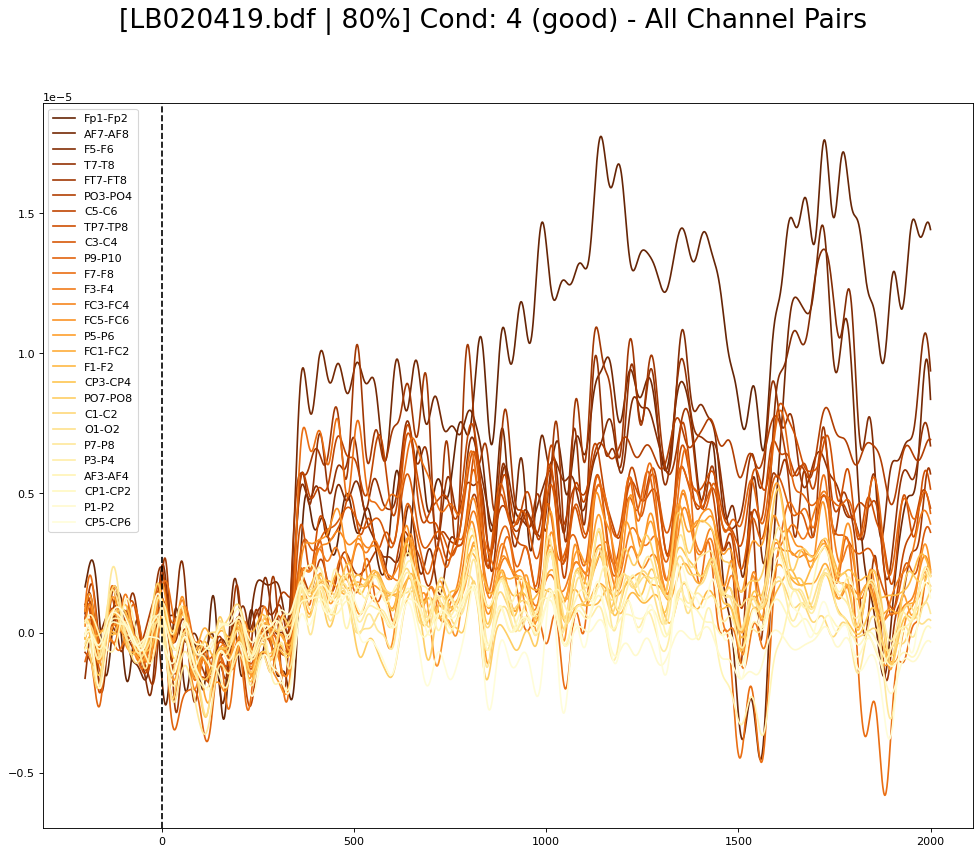

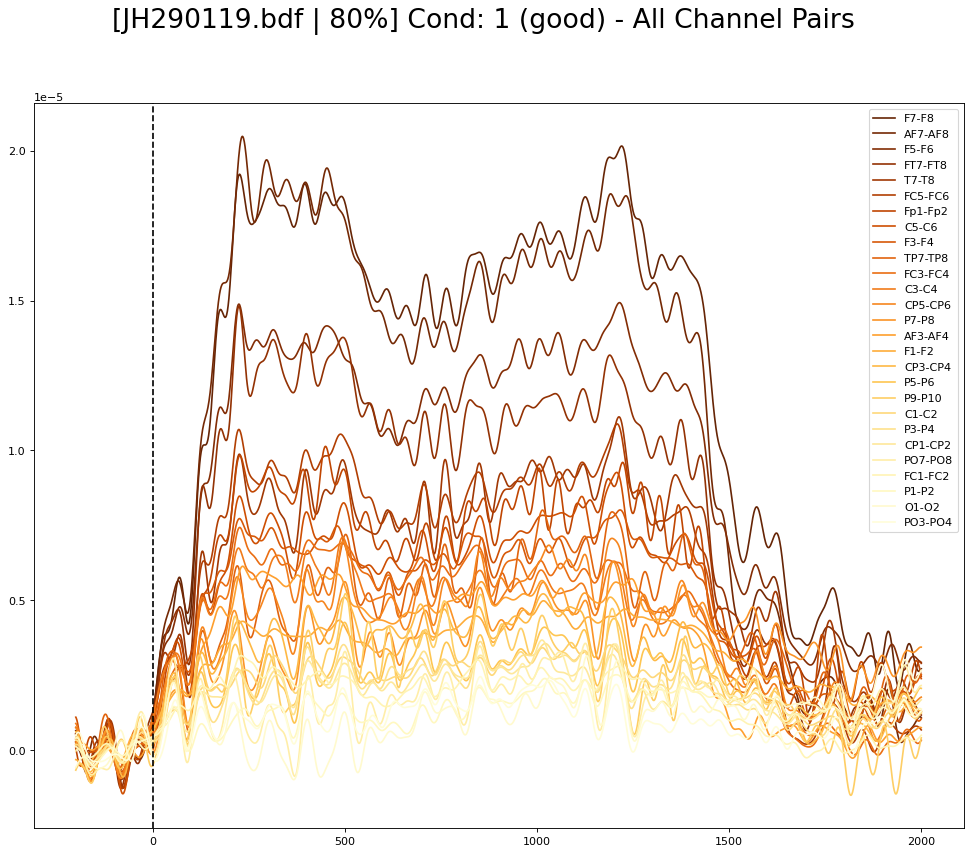

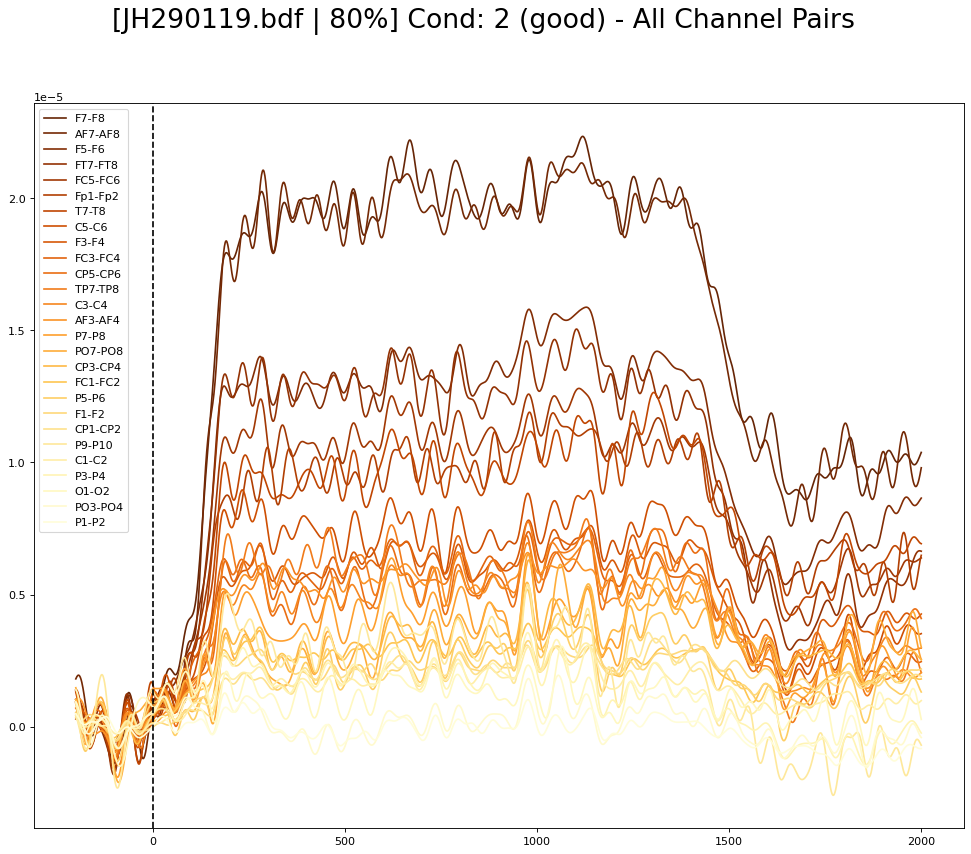

...

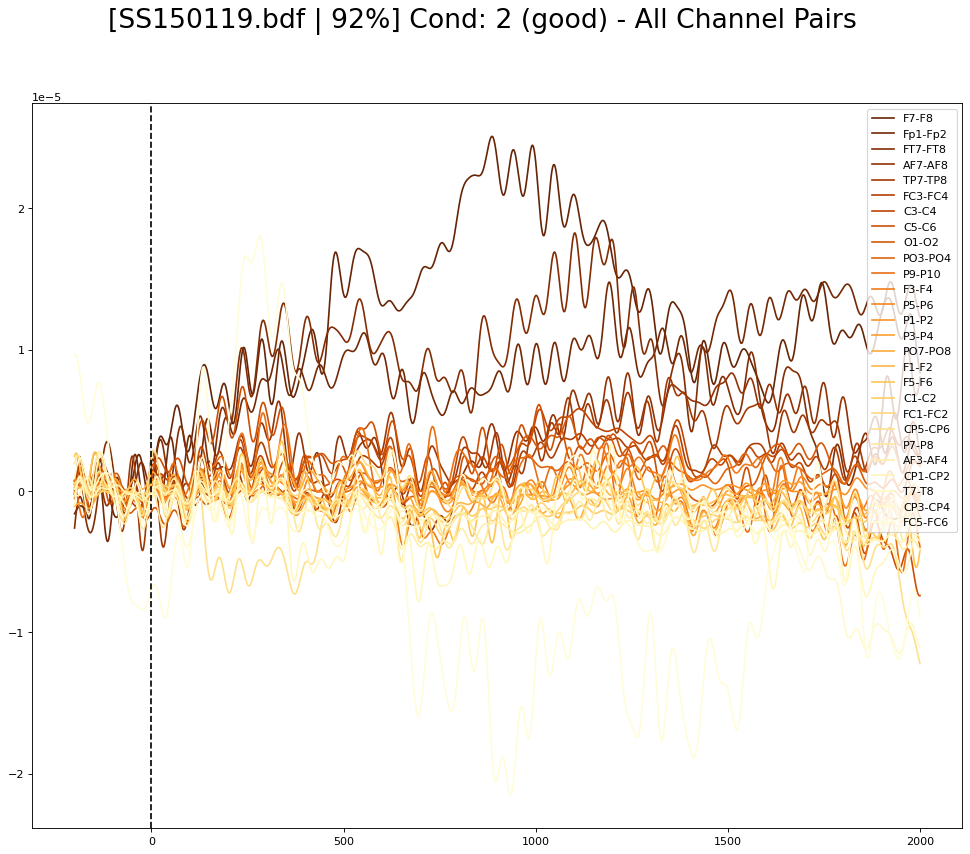

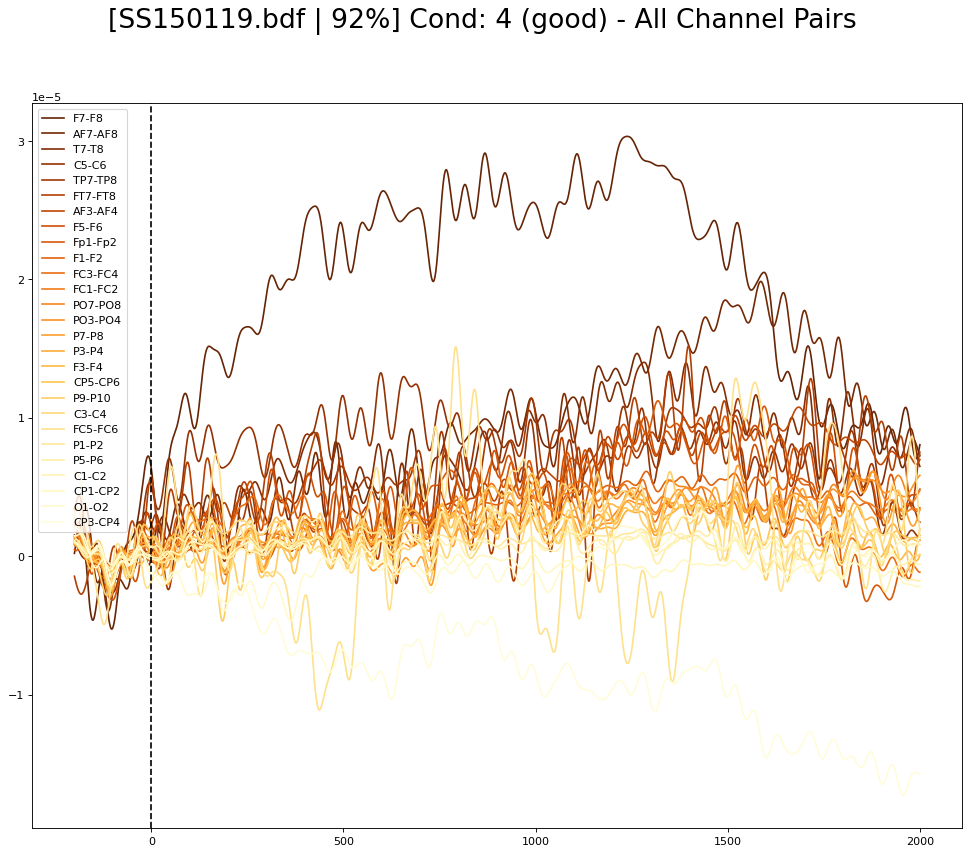

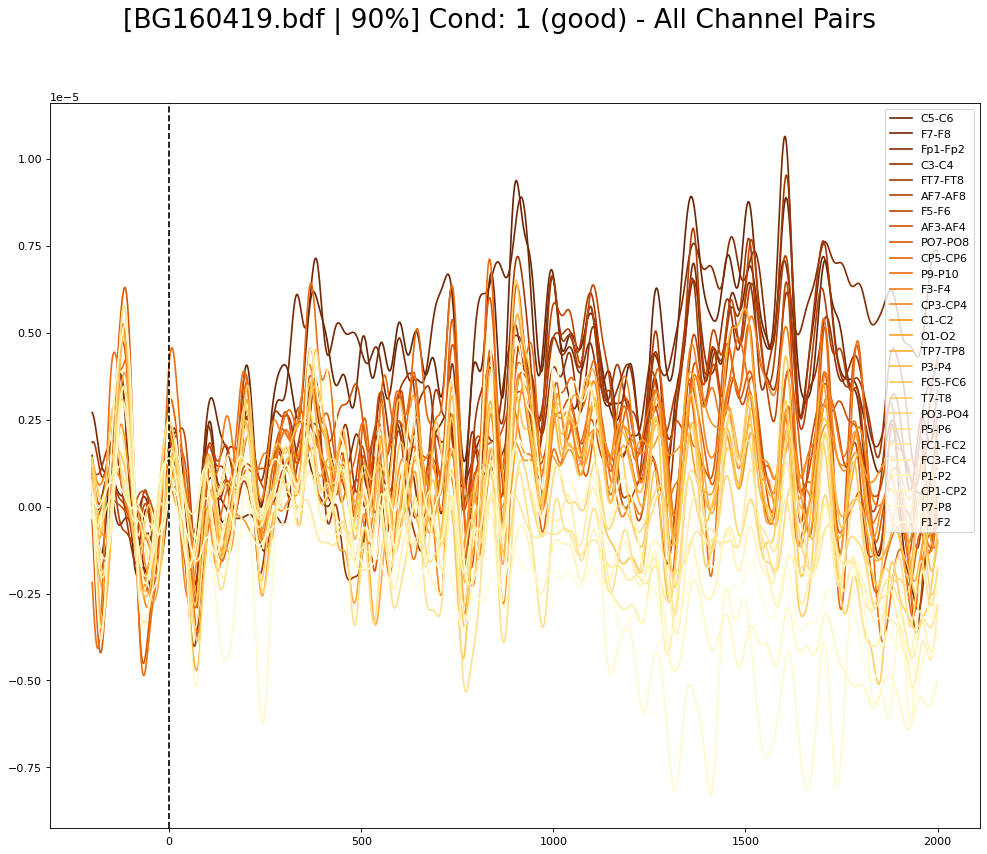

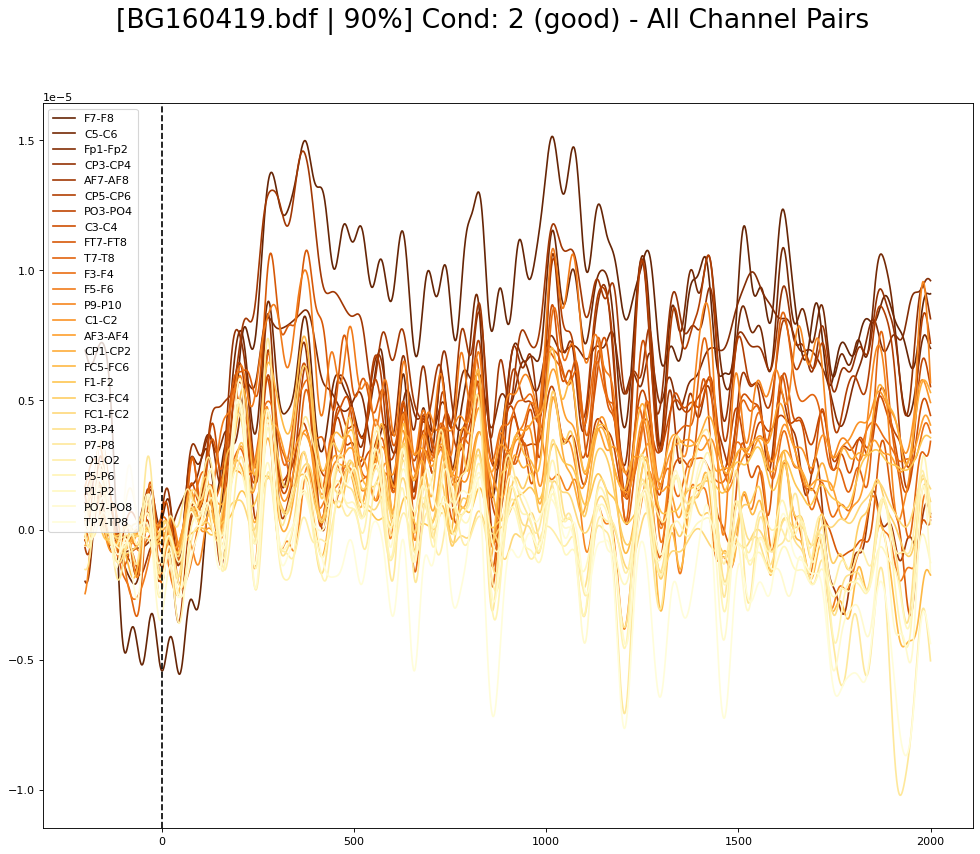

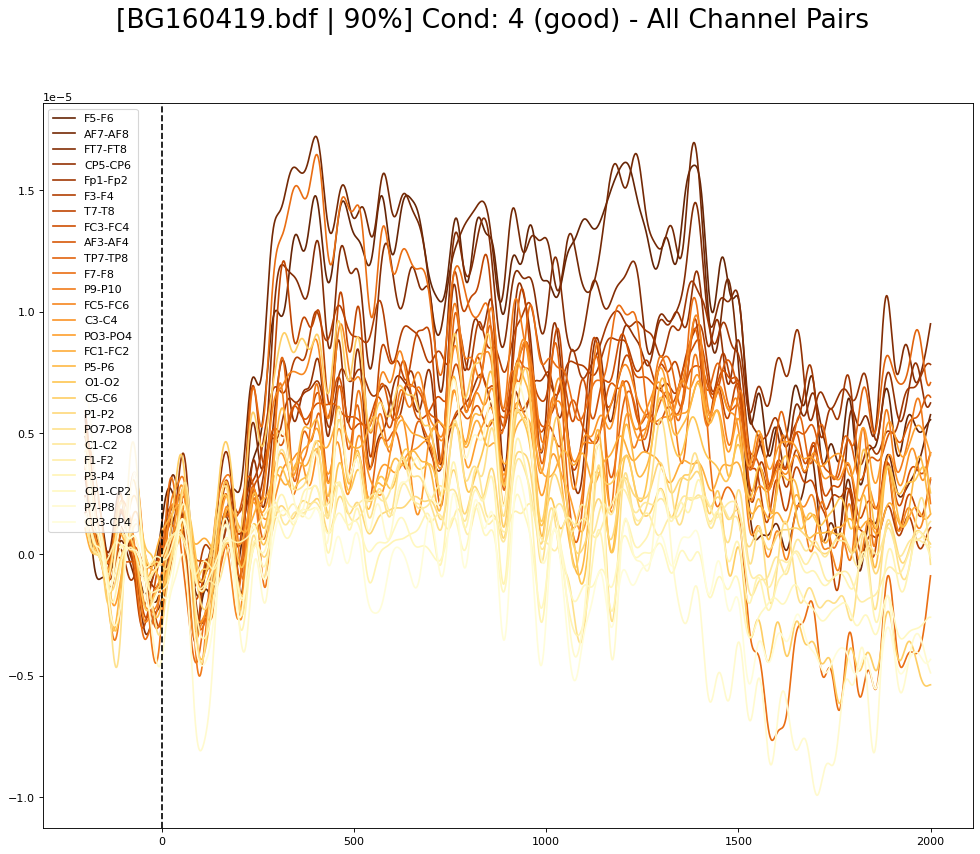

In [51]:
cmap = matplotlib.cm.get_cmap('YlOrBr')

for f in cda_all_channels_per_subj.keys():
    if f in top5 or f in low5:
        for perf in ['good']:#perfs:
            for cond in conds:        
                if len(cda_all_channels_per_subj[f][cond][perf]) > 0:
                    plt.figure(figsize=(15, 12), dpi=80)
                    plt.suptitle("[{} | {}%] Cond: {} ({}) - All Channel Pairs".format(f, report.at[f,'perf'], cond, perf), fontsize=24)

                    ch_pair_mean_amp = [cda_all_channels_per_subj[f][cond][perf][x].mean(0) for x in cda_all_channels_per_subj[f][cond][perf]]
                    mean_list, cda_sorted = zip(*sorted(zip(ch_pair_mean_amp, cda_all_channels_per_subj[f][cond][perf].items()), reverse=True))

                    nb_pairs = len(cda_all_channels_per_subj[f][cond][perf].keys())
                    for i, ch_pair in enumerate(cda_all_channels_per_subj[f][cond][perf].keys()):
                        plt.plot((times * 1000), cda_sorted[i][1], label=cda_sorted[i][0], color=cmap(1-i/nb_pairs))

                    plt.axvline(x=0, color='k', linestyle='--')
                    #plt.gca().invert_yaxis()
                    plt.legend()
                    #plt.show()
                    plt.savefig("./img/Villena-2019-Channels-{}-{}-{}.jpg".format(f, cond, perf), dpi=300)
                else:
                    print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), cond))

# 3 Extra CDA - Midline

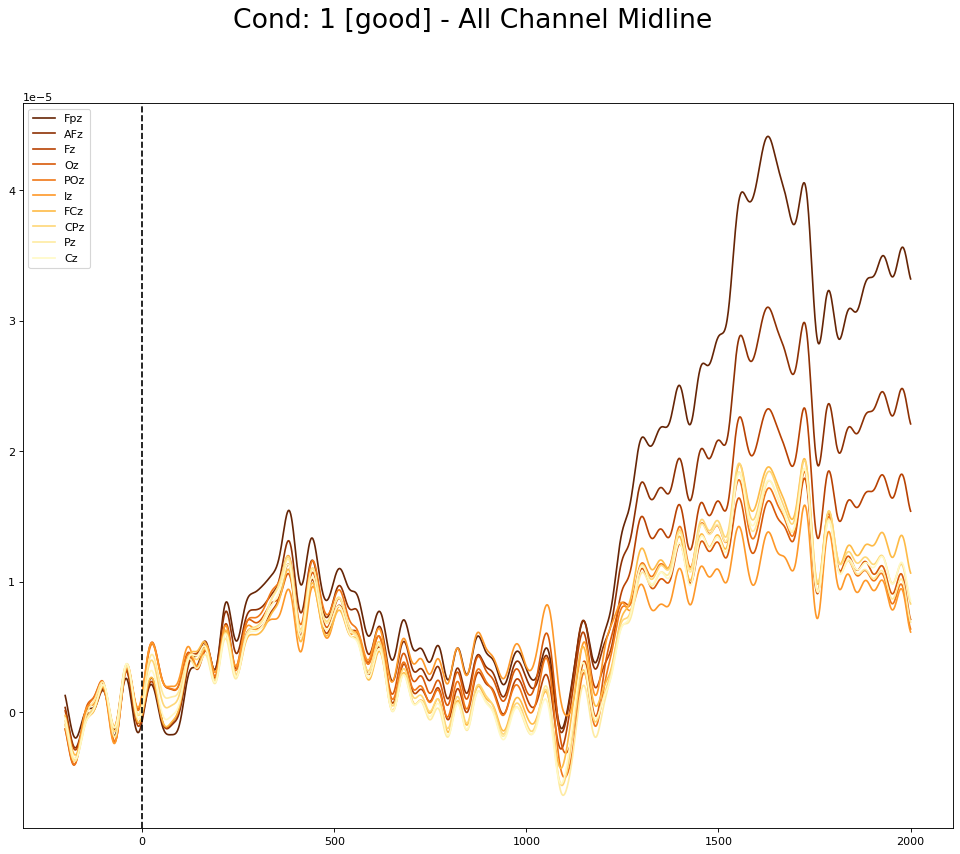

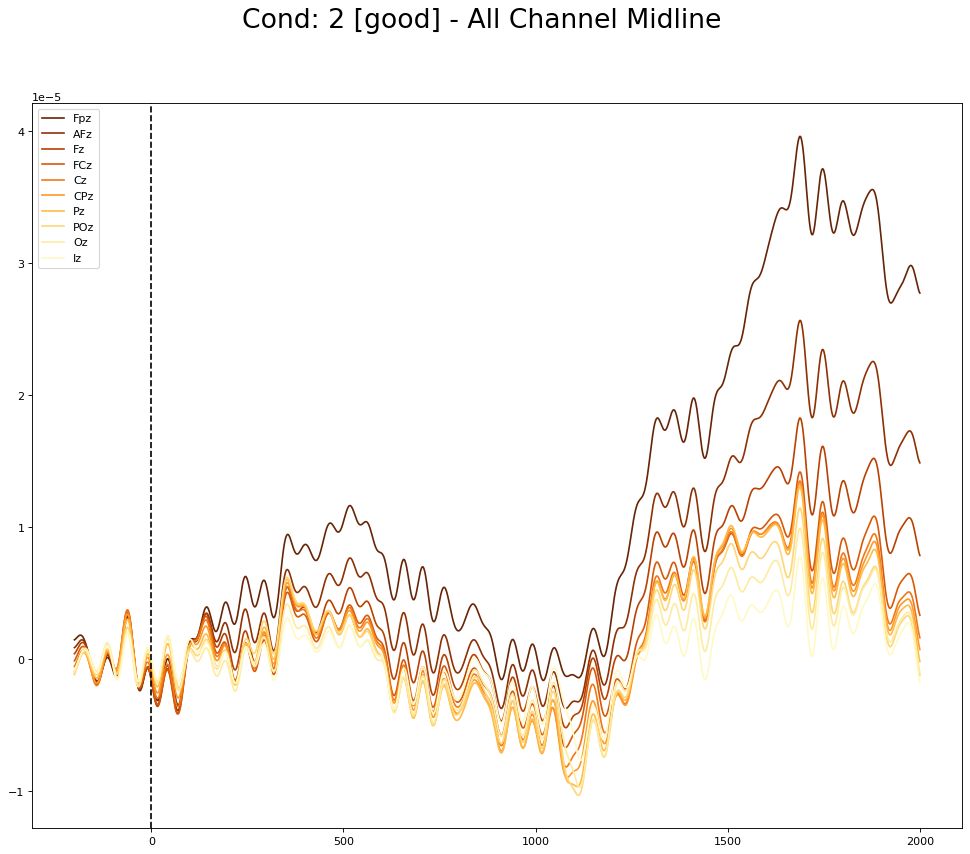

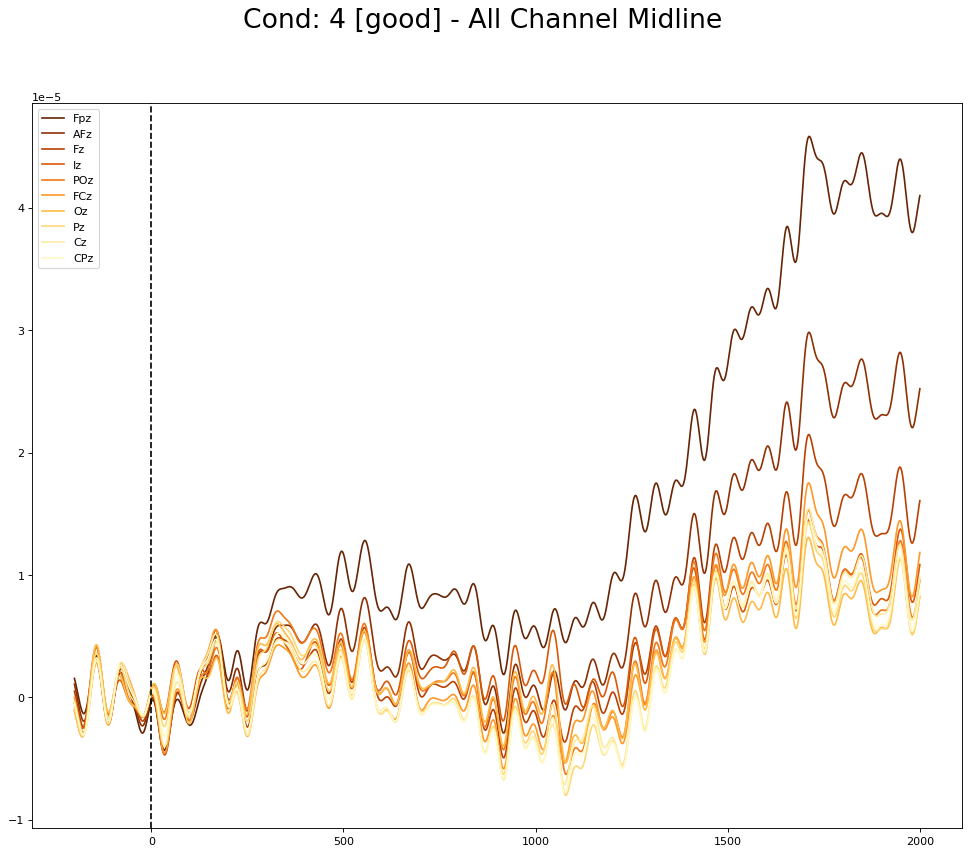

In [52]:
chan_midline_all = ['Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz',  'AFz', 'Fz', 'FCz', 'Cz']

cda_midline_dict = dict()
cda_midline_channels = dict()
for cond in conds:
    cda_midline_channels[cond] = dict()
    for perf in perfs:
        cda_midline_channels[cond][perf] = dict()
    
for i, ch in enumerate(chan_midline_all):
    for file_name in epochs_all.keys():
        epochs_dict = epochs_all[file_name]
        cda_midline_dict[file_name] = dict()

        times = epochs_dict[conds[0]][sides[0]][perfs[0]].times

        for cur_cond in conds:
            cda_midline_dict[file_name][cur_cond] = dict()

            for cur_side in sides:
                cda_midline_dict[file_name][cur_cond][cur_side] = dict()

                for cur_perf in ['good']:#perfs:
                    if epochs_dict[cur_cond][cur_side][cur_perf] is not None:
                        epochs_midline = epochs_dict[cur_cond][cur_side][cur_perf].copy().pick_channels([chan_midline_all[i]])
                        evoked_midline = epochs_midline.average()
                        midline = evoked_midline.data.mean(0)

                        cda_midline_dict[file_name][cur_cond][cur_side][cur_perf] = midline
    
    cda_midline_all = dict()

    for cond in cda_midline_dict[list(cda_midline_dict.keys())[0]].keys():
        cda_midline_all[cond] = dict()
        
        for perf in ['good']: #perfs:
            cda_midline_all[cond][perf] = dict()

            for f in cda_dict.keys():
                if len(cda_midline_dict[f][cond]['left'][perf]) > 0:
                    cda_dict_cur = (cda_midline_dict[f][cond]['left'][perf] + cda_midline_dict[f][cond]['right'][perf])/2
                    cda_midline_all[cond][perf] = np.vstack([cda_midline_all[cond][perf], cda_dict_cur]) if len(cda_midline_all[cond][perf]) else cda_dict_cur
                else:
                    print("==== SKIPPED: 0 points! (File: {} - Cond: {} - Perf: {})".format(str(f), str(cond), perf))
        
            cda_midline_channels[cond][perf]["{}".format(chan_midline_all[i])] = cda_midline_all[cond][perf].mean(0)

# Plot
cmap = matplotlib.cm.get_cmap('YlOrBr')

for perf in ['good']:#perfs:
    for cond in conds:
        plt.figure(figsize=(15, 12), dpi=80)
        plt.suptitle("Cond: {} [{}] - All Channel Midline".format(cond, perf), fontsize=24)

        ch_pair_mean_amp = [cda_midline_channels[cond][perf][x].mean(0) for x in cda_midline_channels[cond][perf]]
        mean_list, cda_sorted = zip(*sorted(zip(ch_pair_mean_amp, cda_midline_channels[cond][perf].items()), reverse=True))

        nb_pairs = len(cda_midline_channels[cond][perf].keys())
        for i, ch_pair in enumerate(cda_midline_channels[cond][perf].keys()):
            plt.plot((times * 1000), cda_sorted[i][1], label=cda_sorted[i][0], color=cmap(1-i/nb_pairs))

        plt.axvline(x=0, color='k', linestyle='--')
        #plt.gca().invert_yaxis()
        plt.legend()
        #plt.show()
        plt.savefig("./img/Villena-2019-Channels-Midline-{}-{}.jpg".format(cond, perf), dpi=300)
